# Figure 2, 3, 7, S2, S3

In [1]:
import importlib, os, gc, sys

from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import xarray as xr
from scipy.interpolate import interp1d
from scipy.optimize import fsolve, fmin
from scipy.signal import convolve as conv
import gsw
import cmocean.cm as cmo
from datetime import datetime as dt
import math

import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib.cm as cm
import matplotlib.colors as cl
import matplotlib.dates as mdates
from matplotlib.colors import ListedColormap


from scipy.stats import circmean, circstd
import glidertools as gt

# plotting

import seaborn as sns
sns.set(
        rc={
         'axes.axisbelow': False,
         'axes.edgecolor': 'Black',
         'axes.facecolor': 'white',
         'axes.grid': False,
         'axes.labelcolor': 'k',
            
         'axes.spines.right': True,
         'axes.spines.top': True,
         'figure.facecolor': 'white',
         'lines.solid_capstyle': 'round',
         'patch.edgecolor': 'k',
         'patch.force_edgecolor': True,
         'text.color': 'k',
         'xtick.bottom': True,
         'xtick.color': 'k',
         'xtick.direction': 'out',
         'xtick.top': False,
         'ytick.color': 'k',
         'ytick.direction': 'out',
         'ytick.left': True,
         'ytick.right': False},
         font_scale=2)

letters = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z']
alp=0.85

# Define the value ranges and corresponding colors
ranges = [-180, -90, -45, 45, 90, 180]
# colortus = ["#d5d9cd","#884da8","#b8ce69","#a0d9d9","#d5d9cd"] #
colortus = ["beige","#884da8","#b8ce69","#a0d9d9","beige"] #
cma = ListedColormap(colortus)
norm = cl.BoundaryNorm(ranges, len(colortus))
cma

import warnings
warnings.filterwarnings('ignore')

## Define functions to grid and mask

In [2]:
def make_mask(df, TransNum):  ## mask data where less than TransNum number of transects!
    msk_data=(np.count_nonzero(~np.isnan(df.pgw_frac), axis=0)>TransNum).astype(float)
    msk_data[msk_data==0]=np.nan
    return msk_data

def grid2d(x, y, v, xi=1, yi=1, fn='median'):
    if np.size(xi) == 1:
        xi = np.arange(np.nanmin(x), np.nanmax(x)+xi, xi)
    if np.size(yi) == 1:
        yi = np.arange(np.nanmin(y), np.nanmax(y)+yi, yi)

    raw = pd.DataFrame({'x':x,'y':y,'v':v}).dropna()

    grid = np.full([np.size(yi),np.size(xi)], np.nan)
    
    raw['xbins'],xbin_iter = pd.cut(raw.x, xi,retbins=True,labels=False)
    raw['ybins'],ybin_iter = pd.cut(raw.y, yi,retbins=True,labels=False)

    _tmp = raw.groupby(['xbins','ybins'])['v'].agg(fn)
    grid[_tmp.index.get_level_values(1).astype(int),_tmp.index.get_level_values(0).astype(int)] = _tmp.values

    XI,YI = np.meshgrid(xi, yi, indexing='ij')
    return grid,XI.T,YI.T

# grid per profile
def grid_p(fr , var):
    var_g, x, y=  grid2d(
        fr.profile_num.values,
        fr.pressure.values, 
        fr[var].values, 
        xi=1, yi=yaxis, fn='mean')
    return var_g, x, y

# grid per time 
def grid_t(ds, var):
    var_g, x, y=  grid2d(
        ds.time.values,
        ds.pressure.values, 
        ds[var].values, 
        xi=taxis, yi=yaxis, fn='mean')
    return var_g, x, y

## Load data 2021 - 22

In [3]:
df=xr.open_dataset('/home/jupyter-estelfont/datasets/oman_202122/final/SEA057.nc')
dadcp=xr.open_dataset('/home/jupyter-estelfont/datasets/oman_202122/final/SEA057_adcp.nc')

### Grid per profile dataset in 1 m bins to derive Tu and O2_z gradient

In [4]:
sigmaaxis=np.arange(20,28,0.005)
yaxis=np.arange(0,1000,1)
taxis= np.arange(np.datetime64("2021-10-01"), np.datetime64("2022-10-31"), np.timedelta64(4, "h"))

sa_ds, xx,yy = grid_p(df, 'abs_salinity')
ct_ds, _,_ = grid_p(df, 'cons_temp')
o2_ds, _,_ = grid_p(df, 'oxygen_concentration')
sigma_ds, _,_ = grid_p(df, 'potential_density')

# o2 vertical gradient:
o2_vertgrad=pd.DataFrame(np.nanmean(np.diff(o2_ds, axis=0), axis=1)/1)[0].to_numpy()
o2z_57=o2_vertgrad

# isopycnal depths:
meansig2122= np.nanmean(sigma_ds, axis=1)[1:]

In [5]:
# Compute TU and roll a circular mean 5
Tu=gsw.Turner_Rsubrho(sa_ds, ct_ds, yy)[0]
Tu_rolled=pd.DataFrame(np.deg2rad(Tu)).rolling(5, center=True).agg(circmean,high=np.pi,  low=-np.pi, nan_policy='omit')

In [6]:
# MODA of Tu per depth bin
Tu_mode=[np.nan]
for i in tqdm(range(1, len(yaxis)-1)):
    Tu_mode.append(Tu_rolled.T.groupby(pd.cut(np.rad2deg(Tu_rolled).T[i], [-180, -90, -45, 45,90,180])).size().reset_index().idxmax()[0])
    
Tu_mode=np.array(Tu_mode)

Tu_mode[Tu_mode==0]=-130
Tu_mode[Tu_mode==1]=-60
Tu_mode[Tu_mode==2]=0
Tu_mode[Tu_mode==3]=60
Tu_mode[Tu_mode==4]=130

Tu_57=Tu_mode

  0%|          | 0/998 [00:00<?, ?it/s]

Text(0.5, 0, 'Tu ::   unstable-diff-stable-finger-unstable')

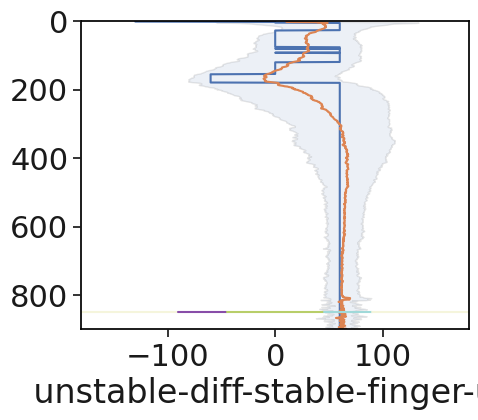

In [7]:
# fig to compare mean of Tu (orange) and std (shading blue) vs moda of Tu (blue)
plt.figure(figsize=(5,4))
# mean and std Tu
meanTu=circmean(Tu_rolled.to_numpy(),high=np.pi,  low=-np.pi, axis=1, nan_policy='omit')
stdTu=circstd(Tu_rolled.to_numpy(),high=np.pi,  low=-np.pi, axis=1, nan_policy='omit')
Tu_mean=np.rad2deg(meanTu)
Tu_min=Tu_mean-np.rad2deg(stdTu)
Tu_max=Tu_mean+np.rad2deg(stdTu)

# plot mean, mode, and std
plt.plot(Tu_mode, np.arange(0,1000,1)[:-1])
plt.plot(Tu_mean, np.arange(0,1000,1)[:-1])
plt.fill_betweenx( np.arange(0,1000,1)[:-1], Tu_min, Tu_max, alpha=0.1)

plt.plot([-180,-90], [850,850], c=colortus[0])
plt.plot([-90,-45], [850,850], c=colortus[1])
plt.plot([-45,45], [850,850], c=colortus[2])
plt.plot([45,90], [850,850], c=colortus[3])
plt.plot([90,180], [850,850], c=colortus[4])
plt.xlim(-180,180)

plt.ylim(900,0)
plt.xlabel('Tu ::   unstable-diff-stable-finger-unstable')

### Grid per profile dataset in 2 m bins to derive Richardson Ri

In [8]:
yaxis=np.arange(0,1000, 2)

sa_ds, xx,yy = grid_p(df, 'abs_salinity')
ct_ds, _,_ = grid_p(df, 'cons_temp')
# o2_ds, _,_ = grid_p(df, 'oxygen_concentration')
VE_ds, _,_ = grid_p(dadcp, 'V_refE_detided')
VN_ds, _,_ = grid_p(dadcp, 'V_refN_detided')
sigma_ds, _,_ = grid_p(df, 'potential_density')

# isopycnal depths:
measigma2122_RI2m=np.nanmean(sigma_ds,axis=1)

# N2:
n2_DS=gsw.Nsquared(sa_ds, ct_ds, yy)[0]

# Vertical shear: -- Vel are interp and smoothed 3 profiles horiz
V_refEE_roll=pd.DataFrame(VE_ds).interpolate(limit=3, axis=1).rolling(3, center=True).mean().to_numpy()
V_refNN_roll=pd.DataFrame(VN_ds).interpolate(limit=3, axis=1).rolling(3, center=True).mean().to_numpy()

V_across_z=np.diff(V_refEE_roll, axis=0)/2
V_along_z=np.diff(V_refNN_roll, axis=0)/2

Sh2=V_across_z**2+V_along_z**2

# figure to check n2
# plt.figure(figsize=(50,5), constrained_layout=True)
# plt.pcolormesh(xx[:-1], yy[:-1], pd.DataFrame(n2_DS).rolling(1, center=True, axis=0).mean(), cmap='Blues', vmin=0,   vmax=0.0001)
# plt.ylim(800,0)
# plt.colorbar()
# plt.show()

# Inverse richardson number and count of profiles of Ri-1>1 and Ri-1>4!

RI=Sh2/n2_DS

Ri_4=[]
for i in tqdm(range(1, len(yaxis)-4)):
    Ri_4.append(np.count_nonzero((pd.DataFrame(RI).T[i].dropna()>4).astype(int))/len(pd.DataFrame(RI).T[i].dropna()))
    
    
Ri_1=[]
for i in tqdm(range(1, len(yaxis)-4)):
    Ri_1.append(np.count_nonzero((pd.DataFrame(RI).T[i].dropna()>1).astype(int))/len(pd.DataFrame(RI).T[i].dropna()))

# percentage of profiles of Ri >4
percent_Ri=np.array(Ri_4)*100

  0%|          | 0/495 [00:00<?, ?it/s]

  0%|          | 0/495 [00:00<?, ?it/s]

top boundry
11.42802500499529
34.68744110581197
bottom boundry
13.808269250698512
36.739045764362224


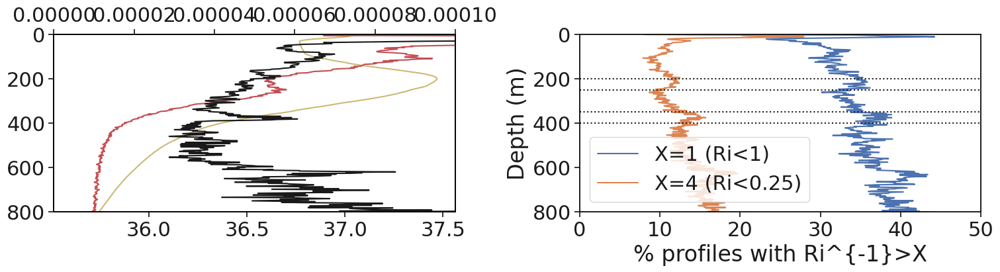

median percentage of prof more than 4 and more than 1
12.535290796160362 35.019206145966706


In [10]:
plt.figure(figsize=(15,4), constrained_layout=True)

plt.subplot(121)
# mean salinity profile (YELLOW)
plt.plot(np.nanmean(sa_ds, axis=1),yaxis, c='y')

# mean n2 and sh profile (RED and BLACK)
plt.twiny()
plt.plot(np.nanmean(n2_DS, axis=1), yaxis[1:], c='r')
plt.plot(np.nanmean(Sh2, axis=1), yaxis[1:], c='k')
plt.xlim(0,0.0001)

plt.gca().invert_yaxis()
plt.ylim(800,0)


plt.subplot(122)

plt.plot(pd.DataFrame(np.array(Ri_1)*100).rolling(1, center=True).mean(), yaxis[1:-4], label='X=1 (Ri<1)')
plt.plot(pd.DataFrame(np.array(Ri_4)*100).rolling(1, center=True).mean(), yaxis[1:-4], label='X=4 (Ri<0.25)')
plt.legend()

plt.axhline(350, c='k', ls=':')
plt.axhline(400, c='k', ls=':')
plt.axhline(200, c='k', ls=':')
plt.axhline(250, c='k', ls=':')

print('top boundry')
print(np.nanmedian(pd.DataFrame(np.array(Ri_4)*100).rolling(1, center=True).mean()[100:126]))
print(np.nanmedian(pd.DataFrame(np.array(Ri_1)*100).rolling(1, center=True).mean()[100:126]))

print('bottom boundry')
      
print(np.nanmedian(pd.DataFrame(np.array(Ri_4)*100).rolling(1, center=True).mean()[175:201]))
print(np.nanmedian(pd.DataFrame(np.array(Ri_1)*100).rolling(1, center=True).mean()[175:201]))

plt.xlim(0,50)
plt.ylim(800,0)
plt.xlabel('% profiles with Ri^{-1}>X')
plt.ylabel('Depth (m)')
plt.show()

print('median percentage of prof more than 4 and more than 1')
print(np.nanmedian(np.array(Ri_4)*100)  , np.nanmedian(np.array(Ri_1)*100)    )

# Timeseries 2021-22

In [11]:
ds=xr.open_dataset('/home/jupyter-estelfont/datasets/oman_202122/final/SEA057.nc')

def grid_t(var):
    var_g, x, y=  grid2d(
        ds.time.values,
        ds.pressure.values, 
        ds[var].values, 
        xi=taxis, yi=yaxis, fn='mean')
    return var_g, x, y

# grid in time adcp
def grid_t_adcp(var):
    var_g, x, y=  grid2d(
        dadcp.time.values,
        dadcp.pressure.values, 
        dadcp[var].values, 
        xi=taxis,  yi=yaxis, fn='mean')
    return var_g, x, y

def axis_settings(ax, ax2, fnts):
    daily_=pd.date_range('2021-10-11 00:00:00', freq='21D', periods=25)
    for i in daily_:
        ax.axvline(i, linestyle='dotted', c='silver', lw=3.5)
        
    daily_=pd.date_range('2022-07-11 00:00:00', freq='21D', periods=25)
    for i in daily_:
        ax2.axvline(i, linestyle='dotted', c='silver', lw=3.5)
    ax.set_xlim(pd.to_datetime('10-04-2021'), pd.to_datetime('03-21-2022'))
    ax2.set_xlim(pd.to_datetime('07-01-2022'), pd.to_datetime('10-17-2022'))
    ax.spines['right'].set_visible(False)
    ax2.spines['left'].set_visible(False)
    ax.yaxis.tick_left()
    ax2.yaxis.set_ticks([])

    d = .01/2 # how big to make the diagonal lines in axes coordinates
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    ax.plot((1-d,1+d), (-4*d,4*d), **kwargs)
    ax.plot((1-d,1+d),(1-4*d,1+4*d), **kwargs)

    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY, interval=3))
    ax.xaxis.set_minor_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY, interval=1))
    ax.tick_params(which='major', width=3,  length=10)
    ax.set_ylabel('Depth (m)', fontsize=fnts)
    d = .007 # how big to make the diagonal lines in axes coordinates
    kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
    ax2.plot((-d,+d), (1-3*d,1+3*d), **kwargs)
    ax2.plot((-d,+d), (-3*d,+3*d), **kwargs)

    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
    ax2.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY, interval=3))
    ax2.xaxis.set_minor_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY, interval=1))
    ax2.tick_params(which='major', width=3,  length=10)
    
    ax.set_ylim(500,0)
    ax2.set_ylim(500,0)

In [12]:
yaxis=np.arange(0,1000,1)
taxis= np.arange(np.datetime64("2021-10-01"), np.datetime64("2022-10-31"), np.timedelta64(4, "h"))


saa,XI, YI = grid_t('abs_salinity')
ctt, _,_ = grid_t('cons_temp')

# Compute TU and roll a circular mean 5
Tu=gsw.Turner_Rsubrho(pd.DataFrame(saa).interpolate(limit=3, axis=1).to_numpy(), pd.DataFrame(ctt).interpolate(limit=3, axis=1).to_numpy(), YI)[0]
Tu_rolled=pd.DataFrame(np.deg2rad(Tu)).rolling(5, center=True).agg(circmean,high=np.pi,  low=-np.pi, nan_policy='omit')

In [13]:
yaxis=np.arange(0,1000,2)

saa,XI, YI = grid_t('abs_salinity')
ctt, _,_ = grid_t('cons_temp')
n2_DS=gsw.Nsquared(pd.DataFrame(saa).interpolate(limit=3, axis=1).to_numpy(), pd.DataFrame(ctt).interpolate(limit=3, axis=1).to_numpy(), YI)[0]

VE_ds, _,_ = grid_t_adcp('V_refE_detided')
VN_ds, _,_ = grid_t_adcp('V_refN_detided')

# Vertical shear: -- Vel are interp and smoothed 3 profiles horiz
V_refEE_roll=pd.DataFrame(VE_ds).interpolate(limit=3, axis=1).rolling(1, center=True).mean().to_numpy()
V_refNN_roll=pd.DataFrame(VN_ds).interpolate(limit=3, axis=1).rolling(1, center=True).mean().to_numpy()

V_across_z=np.diff(V_refEE_roll, axis=0)/2
V_along_z=np.diff(V_refNN_roll, axis=0)/2

Sh2=V_across_z**2+V_along_z**2

RI=np.abs(Sh2/n2_DS)
O22,XI, YI = grid_t('oxygen_concentration')
RI_rolled=pd.DataFrame(np.abs(RI)).rolling(3, center=True).mean().rolling(3, center=True, axis=1).mean().to_numpy()
RI_O2=(np.abs(np.diff(pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy(), axis=0)/2))*RI_rolled

In [14]:
yaxis=np.arange(0,1000,2)
O22,XI, YI = grid_t('oxygen_concentration')
ri_4=(pd.DataFrame(1/RI).rolling(3, center=True).median().rolling(3, center=True, axis=1).mean().to_numpy()<0.25).astype(float)

In [15]:
RI_O2_4=(np.abs(np.diff(pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy(), axis=0)/2))*ri_4

In [16]:
## plotting bathymetret in the timeseries in another color!
# Define the value ranges and corresponding colors
ranges = [0,1]
colors = ["w","gainsboro"] #
# Create a colormap based on the ranges and colors
letters = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z']


In [17]:
sigma,_, YI=grid_t('potential_density')
prof=XI.astype(int).copy()
prof[:]=np.arange(0,len(XI[0]))
mld=gt.physics.mixed_layer_depth(prof.flatten(), YI.flatten(), sigma.flatten(), thresh=0.125, ref_depth=2, return_as_mask=False).interpolate(limit=3).rolling(5, center=True).mean()

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

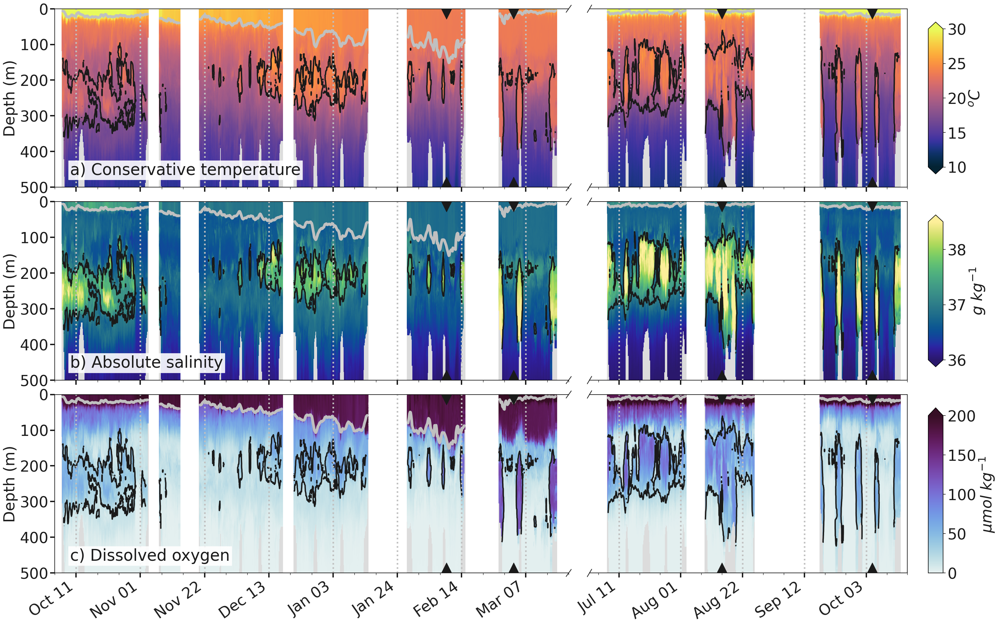

In [19]:
fnts=33
alp=0.9
minn=.03
linw=4
ff = plt.figure(constrained_layout=True, figsize=(35,30))
spec2 = GridSpec(ncols=50, nrows=29+27*3+4, figure=ff)
sixee=45
right, mid, left=0, 29, 48
color_tri='k'
'-------CT------------'

ax = ff.add_subplot(spec2[0:27, right:mid])
ax2 = ff.add_subplot(spec2[0:27, mid+1:left])

yaxis=np.arange(0,1000,1)
O22,XI, YI = grid_t('cons_temp')
PGWfr, _,_ = grid_t('pgw_frac')
bat_arr=np.count_nonzero(~np.isnan(pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy()), axis=0)
bat_arr[bat_arr>0]=1
bathim=YI*np.nan
bathim[:]=bat_arr
cma2 = ListedColormap(colors)
norm2 = cl.BoundaryNorm(ranges, len(colors))
t=ax.text(x=minn,y=.07,s= letters[0] + ') Conservative temperature',size=fnts+2, transform=ax.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

ax.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)
ax2.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)

ax.pcolormesh(taxis, yaxis,pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy(), cmap=cmo.thermal, vmin=10, vmax=30)
cb=ax2.pcolormesh(taxis, yaxis,pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy(), cmap=cmo.thermal, vmin=10, vmax=30)
cbaxes = ff.add_subplot(spec2[2:27-2, left+1])
cbb=plt.colorbar(cb, cax=cbaxes, extend= 'both')
cbb.set_label(r'$^oC$', fontsize=fnts)
cbb.ax.tick_params(labelsize=fnts)

ax.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['k', 'w'], linewidths=[3, 3])
ax2.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['k', 'w'], linewidths=[3, 3])
ax.plot(taxis, mld, c='silver', lw=linw+2)
ax2.plot(taxis, mld, c='silver', lw=linw+2)

axis_settings(ax, ax2, fnts)
ax.tick_params(axis='both', which='major', labelsize=fnts)
ax2.tick_params(axis='both', which='major', labelsize=fnts)

ax2.xaxis.set_ticklabels([])
ax.xaxis.set_ticklabels([])

ax.scatter(pd.to_datetime('2022-03-03'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-03-03'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax.scatter(pd.to_datetime('2022-02-09'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-02-09'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-08-15'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax2.scatter(pd.to_datetime('2022-08-15'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-10-05'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax2.scatter(pd.to_datetime('2022-10-05'), 0, s=2000, marker='v', c=color_tri, zorder=100)


# '------- o2 grad  sections-------------'

ax = ff.add_subplot(spec2[29:29+27, right:mid])
ax2 = ff.add_subplot(spec2[29:29+27, mid+1:left])
yaxis=np.arange(0,1000,1)
O22,XI, YI = grid_t('abs_salinity')
# PGWfr, _,_ = grid_t('pgw_frac')
bat_arr=np.count_nonzero(~np.isnan(pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy()), axis=0)
bat_arr[bat_arr>0]=1
bathim=YI*np.nan
bathim[:]=bat_arr
cma2 = ListedColormap(colors)
norm2 = cl.BoundaryNorm(ranges, len(colors))
t=ax.text(x=minn,y=.07,s= letters[1] + ') Absolute salinity',size=fnts+2, transform=ax.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

ax.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)
ax2.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)

ax.pcolormesh(taxis, yaxis,pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy(), cmap=cmo.haline, vmin=36, vmax=38.5)
cb=ax2.pcolormesh(taxis, yaxis,pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy(), cmap=cmo.haline, vmin=36, vmax=38.5)
cbaxes = ff.add_subplot(spec2[29+2:29+27-2, left+1])
cbb=plt.colorbar(cb, cax=cbaxes, extend= 'both')
cbb.set_label(r'$g$ $kg^{-1}$', fontsize=fnts)
cbb.ax.tick_params(labelsize=fnts)

ax.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['k', 'w'], linewidths=[3,3])
ax2.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['k', 'w'], linewidths=[3, 3])
ax.plot(taxis, mld, c='silver', lw=linw+2)
ax2.plot(taxis, mld, c='silver', lw=linw+2)

axis_settings(ax, ax2, fnts)
ax.tick_params(axis='both', which='major', labelsize=fnts)
ax2.tick_params(axis='both', which='major', labelsize=fnts)

ax2.xaxis.set_ticklabels([])
ax.xaxis.set_ticklabels([])
# ax.axvline(pd.to_datetime('2022-03-03'), linestyle='dotted', c='w', lw=6)
# ax.axvline(pd.to_datetime('2022-02-09'), linestyle='dotted', c='w', lw=6)
# ax2.axvline(pd.to_datetime('2022-08-15'), linestyle='dotted', c='w', lw=6)
# ax2.axvline(pd.to_datetime('2022-10-05'), linestyle='dotted', c='w', lw=6)

ax.scatter(pd.to_datetime('2022-03-03'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-03-03'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax.scatter(pd.to_datetime('2022-02-09'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-02-09'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-08-15'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax2.scatter(pd.to_datetime('2022-08-15'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-10-05'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax2.scatter(pd.to_datetime('2022-10-05'), 0, s=2000, marker='v', c=color_tri, zorder=100)


# '-------tu  sections-------------'

ax = ff.add_subplot(spec2[29+27+2:29+27*2+2, right:mid])
ax2 = ff.add_subplot(spec2[29+27+2:29+27*2+2, mid+1:left])

yaxis=np.arange(0,1000,1)
O22,XI, YI = grid_t('oxygen_concentration')
# PGWfr, _,_ = grid_t('pgw_frac')
bat_arr=np.count_nonzero(~np.isnan(pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy()), axis=0)
bat_arr[bat_arr>0]=1
bathim=YI*np.nan
bathim[:]=bat_arr
cma2 = ListedColormap(colors)
norm2 = cl.BoundaryNorm(ranges, len(colors))
t=ax.text(x=minn,y=.07,s= letters[2] + ') Dissolved oxygen' ,size=fnts+2, transform=ax.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

ax.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)
ax2.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)

ax.pcolormesh(taxis, yaxis,pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy(), cmap=cmo.dense, vmin=0, vmax=200)
cb=ax2.pcolormesh(taxis, yaxis,pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy(), cmap=cmo.dense, vmin=0, vmax=200)
cbaxes = ff.add_subplot(spec2[29+27+2+2:29+27*2+2, left+1])
cbb=plt.colorbar(cb, cax=cbaxes, extend= 'max')
cbb.set_label(r'$\mu mol$ $kg^{-1}$', fontsize=fnts)
cbb.ax.tick_params(labelsize=fnts)
ax.plot(taxis, mld, c='silver', lw=linw+2)
ax2.plot(taxis, mld, c='silver', lw=linw+2)

ax.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['k', 'w'], linewidths=[3,3])
ax2.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['k', 'w'], linewidths=[3, 3])

axis_settings(ax, ax2, fnts)
ax.tick_params(axis='both', which='major', labelsize=fnts)
ax2.tick_params(axis='both', which='major', labelsize=fnts)

ax.scatter(pd.to_datetime('2022-03-03'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-03-03'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax.scatter(pd.to_datetime('2022-02-09'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-02-09'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-08-15'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax2.scatter(pd.to_datetime('2022-08-15'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-10-05'), 500, s=2000, marker='^', c=color_tri, zorder=5)
ax2.scatter(pd.to_datetime('2022-10-05'), 0, s=2000, marker='v', c=color_tri, zorder=5)

plt.setp( ax.xaxis.get_majorticklabels() , rotation=35,  horizontalalignment='right')
plt.setp( ax2.xaxis.get_majorticklabels(), rotation=35, horizontalalignment='right' )

# plt.savefig('Figure_2.png', dpi=600)

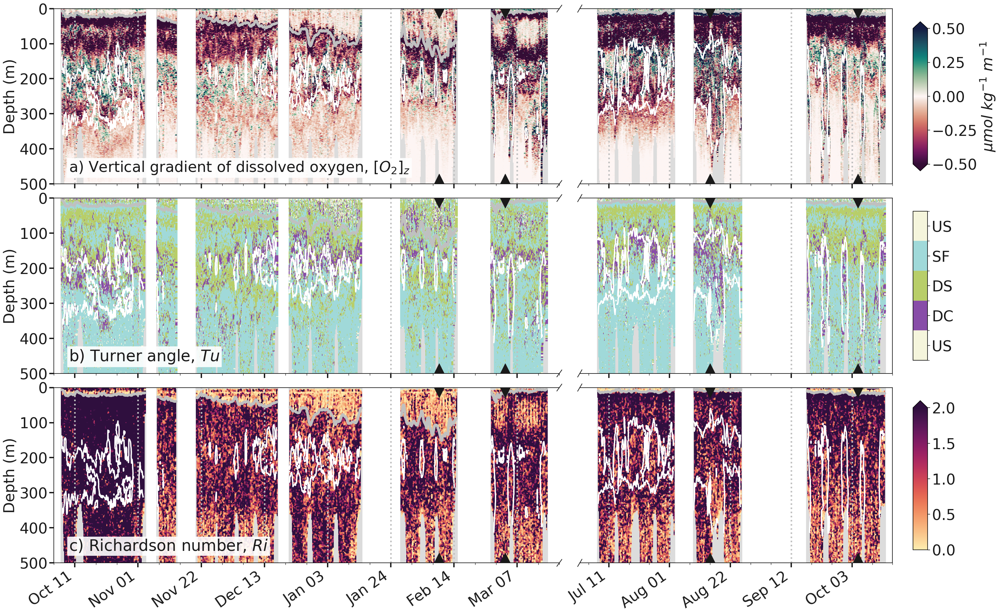

In [37]:
fnts=33
alp=0.9
minn=.03
linw=4
ff = plt.figure(constrained_layout=True, figsize=(35,30))
spec2 = GridSpec(ncols=50, nrows=29+27*3+4, figure=ff)
sixee=45
right, mid, left=0, 29, 48
color_tri='k'
'-------CT------------'
'-------o2 gradient sections-------------'
yaxis=np.arange(0,1000,1)
O22,XI, YI = grid_t('oxygen_concentration')
PGWfr, _,_ = grid_t('pgw_frac')
bat_arr=np.count_nonzero(~np.isnan(pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy()), axis=0)
bat_arr[bat_arr>0]=1
bathim=YI*np.nan
bathim[:]=bat_arr
cma2 = ListedColormap(colors)
norm2 = cl.BoundaryNorm(ranges, len(colors))

ax = ff.add_subplot(spec2[0:27, right:mid])
ax2 = ff.add_subplot(spec2[0:27, mid+1:left])


ax.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)
ax2.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)
t=ax.text(x=minn,y=.07,s=letters[0] + ') Vertical gradient of dissolved oxygen, $[O_2]_z$',size=fnts, transform=ax.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

ax.pcolormesh(taxis, yaxis[:-1], (np.diff(pd.DataFrame(O22).interpolate(limit=3, axis=1).rolling(3, axis=1, center=True).mean().to_numpy(), axis=0)/2), cmap=cmo.curl_r, vmin=-0.5, vmax=0.5)
cb=ax2.pcolormesh(taxis, yaxis[:-1], (np.diff(pd.DataFrame(O22).interpolate(limit=3, axis=1).rolling(3, axis=1, center=True).mean().to_numpy(), axis=0)/2), cmap=cmo.curl_r, vmin=-0.5, vmax=0.5)

cbaxes = ff.add_subplot(spec2[2:27-2, left+1])


cbb=plt.colorbar(cb, cax=cbaxes, extend='both')
cbb.set_label(r'$\mu mol$ $kg^{-1}$ $m^{-1}$', fontsize=fnts)
cbb.ax.tick_params(labelsize=fnts)


ax.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['w', 'w'], linewidths=[3,3])
ax2.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['w', 'w'], linewidths=[3, 3])
ax.plot(taxis, mld, c='silver', lw=linw+2)
ax2.plot(taxis, mld, c='silver', lw=linw+2)

axis_settings(ax, ax2, fnts)
ax.tick_params(axis='both', which='major', labelsize=fnts)
ax2.tick_params(axis='both', which='major', labelsize=fnts)
ax2.xaxis.set_ticklabels([])
ax.xaxis.set_ticklabels([])

ax.scatter(pd.to_datetime('2022-03-03'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-03-03'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax.scatter(pd.to_datetime('2022-02-09'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-02-09'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-08-15'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax2.scatter(pd.to_datetime('2022-08-15'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-10-05'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax2.scatter(pd.to_datetime('2022-10-05'), 0, s=2000, marker='v', c=color_tri, zorder=100)


'-------tu  sections-------------'

ax = ff.add_subplot(spec2[29:29+27, right:mid])
ax2 = ff.add_subplot(spec2[29:29+27, mid+1:left])

ax.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)
ax2.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)
t=ax.text(x=minn,y=.07,s= letters[1] + ') Turner angle, $Tu$',size=fnts+2, transform=ax.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

ax.pcolormesh(taxis, yaxis[:-1], np.rad2deg(Tu_rolled).to_numpy(), cmap=cma , norm=norm)
cb=ax2.pcolormesh(taxis, yaxis[:-1], np.rad2deg(Tu_rolled).to_numpy(), cmap=cma , norm=norm)

cbaxes = ff.add_subplot(spec2[29+2:29+27-2, left+1])

cbb=plt.colorbar(cb, cax=cbaxes, ticks=[-135,-67.5,-0,67.5,135])
# cbb.set_label('', fontsize=fnts)

cbb.ax.set_yticklabels(['US', 'DC', 'DS', 'SF', 'US'])

cbb.ax.tick_params(labelsize=fnts)

ax.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['w', 'w'], linewidths=[3,3])
ax2.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['w', 'w'], linewidths=[3, 3])
ax.plot(taxis, mld, c='silver', lw=linw+2)
ax2.plot(taxis, mld, c='silver', lw=linw+2)

axis_settings(ax, ax2, fnts)
ax.tick_params(axis='both', which='major', labelsize=fnts)
ax2.tick_params(axis='both', which='major', labelsize=fnts)
ax2.xaxis.set_ticklabels([])
ax.xaxis.set_ticklabels([])

ax.scatter(pd.to_datetime('2022-03-03'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-03-03'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax.scatter(pd.to_datetime('2022-02-09'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-02-09'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-08-15'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax2.scatter(pd.to_datetime('2022-08-15'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-10-05'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax2.scatter(pd.to_datetime('2022-10-05'), 0, s=2000, marker='v', c=color_tri, zorder=100)


'------- Ri  sections-------------'
yaxis=np.arange(0,1000,2)

O22,XI, YI = grid_t('oxygen_concentration')
PGWfr, _,_ = grid_t('pgw_frac')
bat_arr=np.count_nonzero(~np.isnan(pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy()), axis=0)
bat_arr[bat_arr>0]=1
bathim=YI*np.nan
bathim[:]=bat_arr
cma2 = ListedColormap(colors)
norm2 = cl.BoundaryNorm(ranges, len(colors))


ax = ff.add_subplot(spec2[29+27+2:29+27*2+2, right:mid])
ax2 = ff.add_subplot(spec2[29+27+2:29+27*2+2, mid+1:left])


t=ax.text(x=minn,y=.07,s= letters[2] + ') Richardson number, $Ri$',size=fnts+2, transform=ax.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))
ax.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)
ax2.pcolormesh(taxis, yaxis, bathim, cmap=cma2, norm=norm2)

ax.pcolormesh(taxis, yaxis[:-1], pd.DataFrame(1/RI).rolling(3, center=True).median().rolling(3, center=True, axis=1).median().to_numpy(), vmin=0, vmax=2, cmap=cmo.matter)
cb=ax2.pcolormesh(taxis, yaxis[:-1], pd.DataFrame(1/RI).rolling(3, center=True).median().rolling(3, center=True, axis=1).median().to_numpy(), vmin=0, vmax=2, cmap=cmo.matter)
cbaxes = ff.add_subplot(spec2[29+27+4:29+27*2, left+1])

cbb=plt.colorbar(cb, cax=cbaxes, extend= 'max')
# cbb.set_label(r'', fontsize=fnts)
cbb.ax.tick_params(labelsize=fnts)

ax.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['w', 'w'], linewidths=[3,3])
ax2.contour(taxis, yaxis, PGWfr, levels=[0.25], colors=['w', 'w'], linewidths=[3, 3])

ax.plot(taxis, mld, c='silver', lw=linw+2)
ax2.plot(taxis, mld, c='silver', lw=linw+2)

axis_settings(ax, ax2, fnts)
ax.tick_params(axis='both', which='major', labelsize=fnts)
ax2.tick_params(axis='both', which='major', labelsize=fnts)

ax.scatter(pd.to_datetime('2022-03-03'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-03-03'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax.scatter(pd.to_datetime('2022-02-09'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax.scatter(pd.to_datetime('2022-02-09'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-08-15'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax2.scatter(pd.to_datetime('2022-08-15'), 0, s=2000, marker='v', c=color_tri, zorder=100)

ax2.scatter(pd.to_datetime('2022-10-05'), 500, s=2000, marker='^', c=color_tri, zorder=100)
ax2.scatter(pd.to_datetime('2022-10-05'), 0, s=2000, marker='v', c=color_tri, zorder=100)


plt.setp( ax.xaxis.get_majorticklabels() , rotation=35,  horizontalalignment='right')
plt.setp( ax2.xaxis.get_majorticklabels(), rotation=35, horizontalalignment='right' )
plt.savefig('Figure_7.png', dpi=600)

In [19]:
np.count_nonzero(np.sum(((1/RI)<0.25)[100:150].astype(float), axis=0)>1)/len(np.sum(((1/RI)<0.25)[100:150].astype(float), axis=0)>1)

0.3240506329113924

## Load data 2015 - 16

In [21]:
df_02=xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/SG502.nc')
df_10=xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/SG510.nc')
df_79=xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/SG579.nc')

# make sure o2 is despiked
df_10.oxygen_concentration[df_10.oxygen_concentration>300]=np.nan
df_10.oxygen_concentration[df_10.oxygen_concentration<0]=np.nan
df_79.oxygen_concentration[df_79.oxygen_concentration>300]=np.nan
df_79.oxygen_concentration[df_79.oxygen_concentration<0]=np.nan

# make sure salinity is despiked
df_02.abs_salinity[df_02.abs_salinity<34]=np.nan
df_10.abs_salinity[df_10.abs_salinity<34]=np.nan
df_79.abs_salinity[df_79.abs_salinity<34]=np.nan

### Grid per profile dataset in 1 m bins to derive Tu and O2_z gradient

In [22]:
yaxis=np.arange(0,1000,1)

def compute_Tu(df):
    sa_ds, xx,yy = grid_p(df, 'abs_salinity')
    ct_ds, _,_ = grid_p(df, 'cons_temp')
    o2_ds, _,_ = grid_p(df, 'oxygen_concentration')
    sigma_ds, _,_ = grid_p(df, 'potential_density')

    Tu=gsw.Turner_Rsubrho(sa_ds, ct_ds, yy)[0]
    Tu_rolled=pd.DataFrame(np.deg2rad(Tu)).rolling(5, center=True).agg(circmean,high=np.pi,  low=-np.pi, nan_policy='omit')
    return Tu_rolled, o2_ds, sigma_ds

Tu_1516_rolled=pd.concat([compute_Tu(df_02)[0], compute_Tu(df_10)[0], compute_Tu(df_79)[0]], axis=1)

o2_al1516=np.concatenate([compute_Tu(df_02)[1], compute_Tu(df_10)[1], compute_Tu(df_79)[1]], axis=1)
o2z_1516=pd.DataFrame(np.nanmean(np.diff(o2_al1516, axis=0), axis=1)/1)[0].to_numpy()

sigma_al1516=np.concatenate([compute_Tu(df_02)[2], compute_Tu(df_10)[2], compute_Tu(df_79)[2]], axis=1)
meansig1516= np.nanmean(sigma_al1516, axis=1)[1:]

In [23]:
# MODA of Tu per depth bin
Tu_mode=[np.nan]
for i in tqdm(range(1, len(yaxis)-1)):
    Tu_mode.append(Tu_1516_rolled.T.groupby(pd.cut(np.rad2deg(Tu_1516_rolled).T[i], [-180, -90, -45, 45,90,180])).size().reset_index().idxmax()[0])
    
Tu_mode=np.array(Tu_mode)

Tu_mode[Tu_mode==0]=-130
Tu_mode[Tu_mode==1]=-60
Tu_mode[Tu_mode==2]=0
Tu_mode[Tu_mode==3]=60
Tu_mode[Tu_mode==4]=130

Tu_1516=Tu_mode

  0%|          | 0/998 [00:00<?, ?it/s]

Text(0.5, 0, 'Tu ::   unstable-diff-stable-finger-unstable')

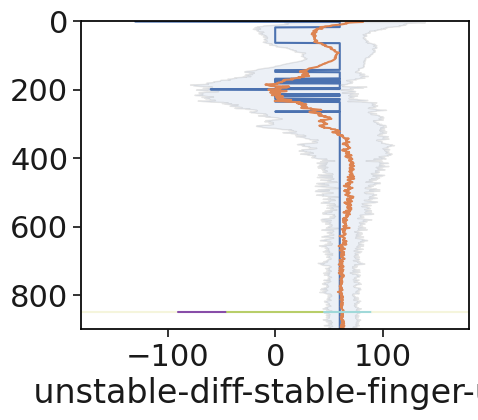

In [24]:
# fig to compare mean of Tu (orange) and std (shading blue) vs moda of Tu (blue)
plt.figure(figsize=(5,4))
# mean and std Tu
meanTu=circmean(Tu_1516_rolled.to_numpy(),high=np.pi,  low=-np.pi, axis=1, nan_policy='omit')
stdTu=circstd(Tu_1516_rolled.to_numpy(),high=np.pi,  low=-np.pi, axis=1, nan_policy='omit')
Tu_mean=np.rad2deg(meanTu)
Tu_min=Tu_mean-np.rad2deg(stdTu)
Tu_max=Tu_mean+np.rad2deg(stdTu)

# plot mean, mode, and std
plt.plot(Tu_mode, np.arange(0,1000,1)[:-1])
plt.plot(Tu_mean, np.arange(0,1000,1)[:-1])
plt.fill_betweenx( np.arange(0,1000,1)[:-1], Tu_min, Tu_max, alpha=0.1)

plt.plot([-180,-90], [850,850], c=colortus[0])
plt.plot([-90,-45], [850,850], c=colortus[1])
plt.plot([-45,45], [850,850], c=colortus[2])
plt.plot([45,90], [850,850], c=colortus[3])
plt.plot([90,180], [850,850], c=colortus[4])
plt.xlim(-180,180)

plt.ylim(900,0)
plt.xlabel('Tu ::   unstable-diff-stable-finger-unstable')

## Profiles per season

### Import data of gridded per sections in depth and sigma space

In [25]:
# depth space
ds_79_g= xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/final/gridded_SG579.nc')
ds_10_g= xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/final/gridded_SG510.nc')
ds_02_g= xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/final/gridded_SG502.nc')
ds_g= xr.open_dataset('/home/jupyter-estelfont/datasets/oman_202122/final/gridded_SEA057.nc')

# sigma space
ds_79_s_g= xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/final/gridded_SG579_sigma.nc')
ds_10_s_g= xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/final/gridded_SG510_sigma.nc')
ds_02_s_g= xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/final/gridded_SG502_sigma.nc')
ds_s_g= xr.open_dataset('/home/jupyter-estelfont/datasets/oman_202122/final/gridded_SEA057_sigma.nc')
ds_s_g['time']=('trans_num', ds_g.time.values)

# concat 2015-16 datasets
ds_15_g=xr.concat([ds_79_g, ds_02_g, ds_10_g], dim='trans_num')
ds_15_s_g=xr.concat([ds_79_s_g, ds_02_s_g, ds_10_s_g], dim='trans_num')
ds_15_s_g['time']=('trans_num', ds_15_g.time.values)

### Function to split profiles in summer vs. winter

In [26]:
# split by seasons 2021-22
def by_seas(dplot, dplot_s):
    ds_bymonth=dplot.groupby('time.month')
    SUMMER=xr.concat([ds_bymonth[3], ds_bymonth[7], ds_bymonth[8], ds_bymonth[9], ds_bymonth[10]], dim='trans_num')
    WINTER=xr.concat([ds_bymonth[11], ds_bymonth[12], ds_bymonth[1], ds_bymonth[2]], dim='trans_num')
    ds_bymonth=dplot_s.groupby('time.month')
    SUMMER_s=xr.concat([ds_bymonth[3], ds_bymonth[7], ds_bymonth[8], ds_bymonth[9], ds_bymonth[10]], dim='trans_num')
    WINTER_s=xr.concat([ds_bymonth[11], ds_bymonth[12], ds_bymonth[1], ds_bymonth[2]], dim='trans_num')
    return SUMMER, WINTER, SUMMER_s, WINTER_s

SUMMER_2122, WINTER_2122, SUMMER_s_2122, WINTER_s_2122=by_seas(ds_g, ds_s_g)

# split by seasons 2015-16
def by_seas1516(dplot, dplot_s):
    ds_bymonth=dplot.groupby('time.month')
    SUMMER=xr.concat([ds_bymonth[3], ds_bymonth[4], ds_bymonth[5], ds_bymonth[6]], dim='trans_num')
    WINTER=xr.concat([ds_bymonth[12], ds_bymonth[1], ds_bymonth[2]], dim='trans_num')
    ds_bymonth=dplot_s.groupby('time.month')
    SUMMER_s=xr.concat([ds_bymonth[3], ds_bymonth[4], ds_bymonth[5], ds_bymonth[6]], dim='trans_num')
    WINTER_s=xr.concat([ds_bymonth[12], ds_bymonth[1], ds_bymonth[2]], dim='trans_num')
    return SUMMER, WINTER, SUMMER_s, WINTER_s

SUMMER_1516, WINTER_1516, SUMMER_s_1516, WINTER_s_1516=by_seas1516(ds_15_g, ds_15_s_g)

# Figure 2 (2021-22)

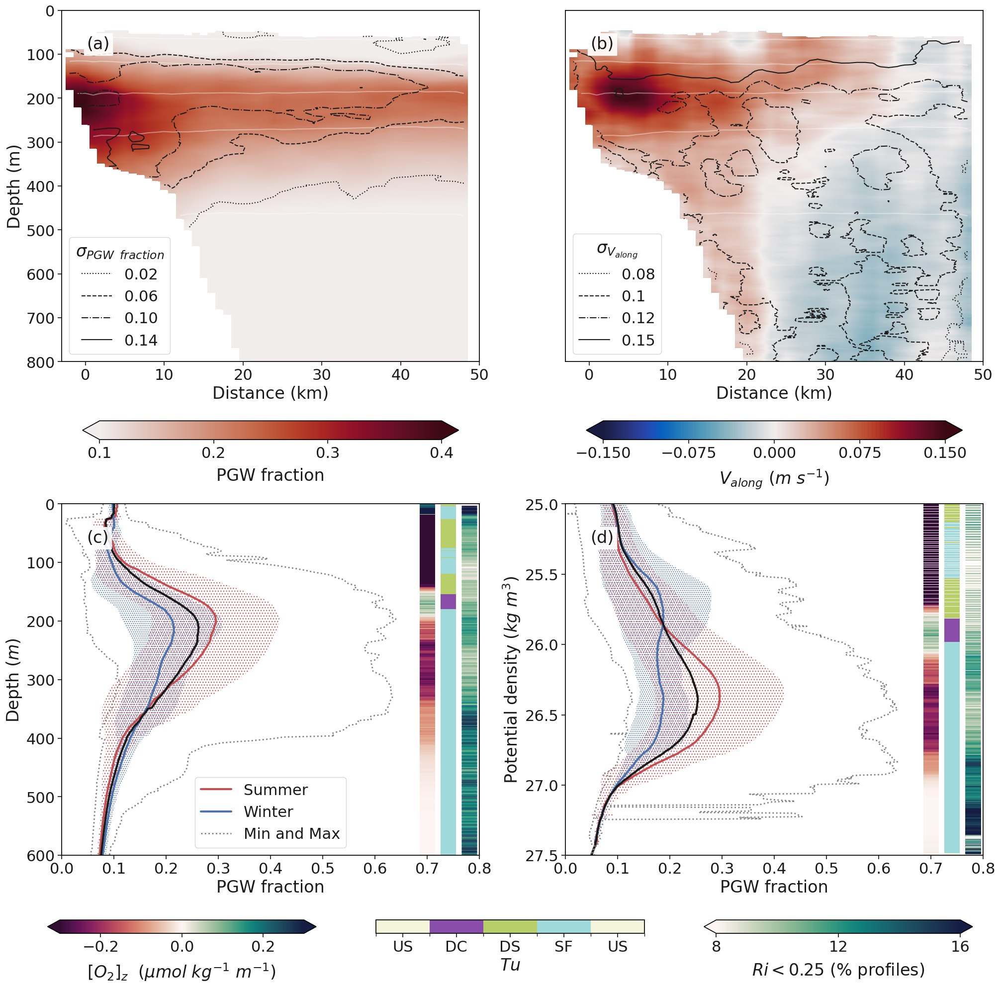

In [36]:
ff=plt.figure(figsize=(20,18), constrained_layout=True)

yaxis=np.arange(0,1000,2)
dplot=ds_g
dplot_s=ds_s_g
Nmsk=35
lolita='2021'
varVWEL='V_along_detided'
xmin, xmax=-3, 50

'------------'

ax1=plt.subplot(221)

t=ax1.text(x=.06,y=.89,s="(" + letters[0] + ')',transform=ax1.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))
cb1=plt.pcolormesh(dplot.x, dplot.y, dplot.pgw_frac.mean('trans_num')*make_mask(dplot, Nmsk), cmap=cmo.amp, vmin=0.1, vmax=0.4)
plt.contourf(dplot.x, dplot.y, dplot.pgw_frac.mean('trans_num')*make_mask(dplot, Nmsk), cmap=cmo.amp, levels=500, vmin=0.1, vmax=0.4)
plt.contour(dplot.x, dplot.y, dplot.potential_density.mean('trans_num')*make_mask(dplot, Nmsk), colors='white', lw=2, alpha=0.4, levels=np.arange(23.5,27.5,0.5))
plt.contour(dplot.x, dplot.y, dplot.pgw_frac.std('trans_num')*make_mask(dplot, Nmsk),  colors='k',levels=[0.02, 0.06, 0.10, 0.14], linestyles=['dotted', 'dashed', 'dashdot', 'solid'])

plt.plot(0,1, c='k', linestyle='dotted', label='0.02')
plt.plot(0,1, c='k', linestyle='dashed', label='0.06')
plt.plot(0,1, c='k', linestyle='dashdot', label='0.10')
plt.plot(0,1, c='k', linestyle='solid', label='0.14')
he=plt.legend( loc='lower left', fancybox=True)
he.set_title("$\sigma_{PGW}$ $_{fraction}$")   
plt.xlabel('Distance (km)')
plt.ylabel('Depth (m)')
plt.xlim(xmin, xmax)
plt.ylim(800,0)

'------------'

ax2=plt.subplot(222)

t=ax2.text(x=.06,y=.89,s="(" + letters[1] + ')',transform=ax2.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

cb2=plt.pcolormesh(dplot.x, dplot.y, dplot[varVWEL].mean('trans_num')*make_mask(dplot, Nmsk), cmap=cmo.balance, vmin=-0.15, vmax=0.15)
plt.contourf(dplot.x, dplot.y, dplot[varVWEL].mean('trans_num')*make_mask(dplot, Nmsk),levels=500, cmap=cmo.balance, vmin=-0.15, vmax=0.15)
plt.xlim(xmin, xmax)
plt.contour(dplot.x, dplot.y, dplot.potential_density.mean('trans_num')*make_mask(dplot, Nmsk), lw=2, colors='white', alpha=0.4, levels=np.arange(23.5,27.5,0.5))
plt.contour(dplot.x, dplot.y, dplot[varVWEL].std('trans_num')*make_mask(dplot, Nmsk), colors='k',levels=[0.08, 0.1, 0.12, 0.15], linestyles=['dotted', 'dashed', 'dashdot', 'solid'])

plt.plot(0,1, c='k', linestyle='dotted', label='0.08')
plt.plot(0,1, c='k', linestyle='dashed', label='0.1')
plt.plot(0,1, c='k', linestyle='dashdot', label='0.12')
plt.plot(0,1, c='k', linestyle='solid', label='0.15')

he=plt.legend( loc='lower left', fancybox=True)
he.set_title("$\sigma_{V_{along}}$")   
plt.yticks([])
plt.ylim(800,0)
plt.xlabel('Distance (km)')

'------------'

ax3=plt.subplot(223)

t=ax3.text(x=.06,y=.89,s="(" + letters[2] + ')',transform=ax3.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

if lolita=='2015':

    SUMMER, WINTER, SUMMER_s, WINTER_s= SUMMER_1516, WINTER_1516, SUMMER_s_1516, WINTER_s_1516
    
    aa=Tu_1516
    o2_vertgrad=o2z_1516
    meansig=meansig1516

else: 
    SUMMER, WINTER, SUMMER_s, WINTER_s= SUMMER_2122, WINTER_2122, SUMMER_s_2122, WINTER_s_2122
    aa=Tu_57
    o2_vertgrad=o2z_57
    meansig=meansig2122
    
mean_pgw_w=np.nanmean(np.concatenate(WINTER.pgw_frac.values, axis=1), axis=1)
std_pgw_w=np.nanstd(np.concatenate(WINTER.pgw_frac.values, axis=1), axis=1)
mean_pgw_s=np.nanmean(np.concatenate(SUMMER.pgw_frac.values, axis=1), axis=1)
std_pgw_s=np.nanstd(np.concatenate(SUMMER.pgw_frac.values, axis=1), axis=1)

plt.fill_betweenx(dplot.y, mean_pgw_w-std_pgw_w, mean_pgw_w+std_pgw_w, alpha=0.9, hatch="....", color='None',  edgecolor="b", linewidth=0.0)
plt.fill_betweenx(dplot.y, mean_pgw_s-std_pgw_s, mean_pgw_s+std_pgw_s, alpha=0.9, hatch="...", color='None',  edgecolor="r", linewidth=0.0)
plt.plot(mean_pgw_s, dplot.y, c='r', lw=3, label='Summer')
plt.plot(mean_pgw_w, dplot.y, c='b', lw=3, label='Winter')

plt.plot(dplot.mean('x').mean('trans_num').pgw_frac, dplot.y, c='k', lw=3)
plt.plot(dplot.max('x').max('trans_num').pgw_frac, dplot.y, c='gray', ls='dotted', label='Min and Max', lw=2)
plt.plot(dplot.min('x').min('trans_num').pgw_frac, dplot.y, c='gray', ls='dotted', lw=2)
plt.xlim(0,0.8)
plt.ylim(600,0)
plt.legend(loc='lower center')

cb3=plt.scatter(np.ones(len(o2_vertgrad))*0.7,  np.arange(0,1000,1)[:-1], c=o2_vertgrad,
                cmap=cmo.curl_r,vmin=-0.3, vmax=0.3, marker="_", s=500)
cb4=plt.scatter(np.ones(len(aa))[:]*0.74, np.arange(0,1000,1)[:-1], c=aa[:], cmap=cma, norm=norm, marker="_", s=500)
cb5=plt.scatter(np.ones(len(percent_Ri[:]))*0.78, np.arange(0,1000,2)[1:-4], c=percent_Ri[:], cmap=cmo.tempo,linewidths=2,   vmin=8, vmax=16, marker="_", s=500)

plt.xlabel('PGW fraction')
plt.ylabel('Depth $(m)$')

'------------'

ax4=plt.subplot(224)
t=ax4.text(x=.06,y=.89,s="(" + letters[3] + ')',transform=ax4.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

mean_pgw_w=np.nanmean(np.concatenate(WINTER_s.pgw_frac.values, axis=1), axis=1)
std_pgw_w=np.nanstd(np.concatenate(WINTER_s.pgw_frac.values, axis=1), axis=1)
mean_pgw_s=np.nanmean(np.concatenate(SUMMER_s.pgw_frac.values, axis=1), axis=1)
std_pgw_s=np.nanstd(np.concatenate(SUMMER_s.pgw_frac.values, axis=1), axis=1)

plt.fill_betweenx(dplot_s.y, mean_pgw_w-std_pgw_w, mean_pgw_w+std_pgw_w, alpha=0.9, hatch="....", color='None',  edgecolor="b", linewidth=0.0)
plt.fill_betweenx(dplot_s.y, mean_pgw_s-std_pgw_s, mean_pgw_s+std_pgw_s, alpha=0.9, hatch="...", color='None',  edgecolor="r", linewidth=0.0)
plt.plot(mean_pgw_s, dplot_s.y, c='r', lw=3)
plt.plot(mean_pgw_w, dplot_s.y, c='b', lw=3)

plt.plot(dplot_s.mean('x').mean('trans_num').pgw_frac, dplot_s.y, c='k', lw=3)
plt.plot(dplot_s.max('x').max('trans_num').pgw_frac, dplot_s.y, c='gray', ls='dotted', lw=2)
plt.plot(dplot_s.min('x').min('trans_num').pgw_frac, dplot_s.y, c='gray', ls='dotted', lw=2)
plt.xlim(0,0.8)
plt.ylim(27.5,25)
plt.xlabel('PGW fraction')
plt.ylabel('Potential density ($kg$ $m^{3}$)')

cb3=plt.scatter(np.ones(len(meansig[39:]))*0.7, meansig[39:], c=o2_vertgrad[39:], cmap=cmo.curl_r,vmin=-0.3, vmax=0.3, marker="_", s=500)
cb4=plt.scatter(np.ones(len(meansig[39:]))*0.74, meansig[39:], c=aa[39:], cmap=cma, norm=norm, marker="_", s=500)
cb5=plt.scatter(np.ones(len(measigma2122_RI2m[1:-4]))*0.78, measigma2122_RI2m[1:-4], c=percent_Ri[:], cmap=cmo.tempo, linewidths=2,  vmin=8, vmax=16, marker="_", s=500)

'------------'

cb=plt.colorbar(cb1, ax=ax1, location='bottom', ticks=[0.1, 0.2, 0.3, 0.4], extend='both', orientation='horizontal', shrink=.9)
cb.set_label('PGW fraction', labelpad=10)

cb=plt.colorbar(cb2, ax=ax2 , location='bottom',  ticks=[-0.15, -0.075, 0, 0.075, 0.15], extend='both', orientation='horizontal', shrink=.9)
cb.set_label("$V_{along}$ ($m$ $s^{-1}$)", labelpad=10)

cbaxes = ff.add_axes([0.03, -0.07, 0.30, 0.30]) 
cbaxes.set_visible(False)
cb=plt.colorbar(cb3, ax=cbaxes, location='bottom',  extend='both', orientation='horizontal', shrink=.9)
cb.set_label(r'$[O_2]_z$  ($\mu mol$ $kg^{-1}$ $m^{-1}$) ', labelpad=10)

cbaxes = ff.add_axes([0.36, -0.07, 0.30, 0.30]) 
cbaxes.set_visible(False)
axiv=plt.colorbar(cb4, ax=cbaxes,  orientation='horizontal', ticks=[-135,-67.5,-0,67.5,135], shrink=.9)
axiv.ax.set_xticklabels(['US', 'DC', 'DS', 'SF', 'US'])
axiv.set_label('$Tu$')#, labelpad=10)

cbaxes = ff.add_axes([0.69, -0.07, 0.30, 0.30]) 
cbaxes.set_visible(False)
cb=plt.colorbar(cb5, ax=cbaxes, location='bottom',extend='both', orientation='horizontal', shrink=.9, ticks=[8, 12, 16])
cb.set_label('$Ri < 0.25$ (% profiles)', labelpad=10)

'------------'

plt.savefig('Figure_3.png', dpi=600)

# Figure suplementary 2 (2015-16)

'------------'

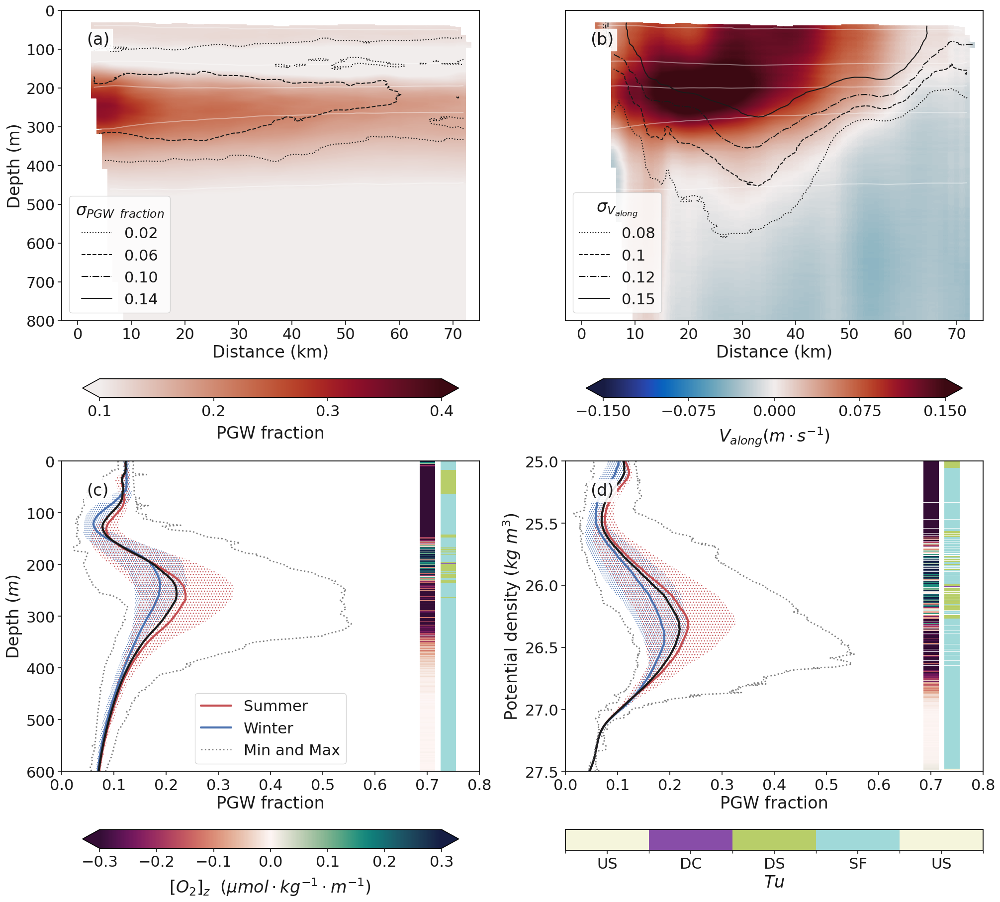

In [35]:
plt.figure(figsize=(20,18), constrained_layout=True)
yaxis=np.arange(0,1000,2)

dplot=ds_15_g
dplot_s=ds_15_s_g
Nmsk=40
lolita='2015'
varVWEL='geostrophy'
xmin, xmax=-3, 75

'------------'

ax1=plt.subplot(221)

t=ax1.text(x=.06,y=.89,s="(" + letters[0] + ')',transform=ax1.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))
  
cb1=plt.pcolormesh(dplot.x, dplot.y, dplot.pgw_frac.mean('trans_num')*make_mask(dplot, Nmsk), cmap=cmo.amp, vmin=0.1, vmax=0.4)
plt.contour(dplot.x, dplot.y, dplot.pgw_frac.mean('trans_num')*make_mask(dplot, Nmsk), cmap=cmo.amp, levels=200,vmin=0.1, vmax=0.4)
plt.contour(dplot.x, dplot.y, dplot.potential_density.mean('trans_num')*make_mask(dplot, Nmsk), colors='white', alpha=0.4, levels=np.arange(23.5,27.5,0.5))
plt.contour(dplot.x, dplot.y, dplot.pgw_frac.std('trans_num')*make_mask(dplot, Nmsk),  colors='k',levels=[0.02, 0.06, 0.10, 0.14], linestyles=['dotted', 'dashed', 'dashdot', 'solid'])

plt.plot(0,1, c='k', linestyle='dotted', label='0.02')
plt.plot(0,1, c='k', linestyle='dashed', label='0.06')
plt.plot(0,1, c='k', linestyle='dashdot', label='0.10')
plt.plot(0,1, c='k', linestyle='solid', label='0.14')
he=plt.legend( loc='lower left', fancybox=True)
he.set_title("$\sigma_{PGW}$ $_{fraction}$")   
plt.xlabel('Distance (km)')
plt.ylabel('Depth (m)')

plt.xlim(xmin, xmax)
plt.ylim(800,0)

'------------'
ax2=plt.subplot(222)

t=ax2.text(x=.06,y=.89,s="(" + letters[1] + ')',transform=ax2.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

cb2=plt.pcolormesh(dplot.x, dplot.y, dplot[varVWEL].mean('trans_num')*make_mask(dplot, Nmsk), cmap=cmo.balance, vmin=-0.15, vmax=0.15)
plt.contour(dplot.x, dplot.y, dplot[varVWEL].mean('trans_num')*make_mask(dplot, Nmsk), cmap=cmo.balance, levels=200,  vmin=-0.15, vmax=0.15)
plt.xlim(xmin, xmax)

plt.contour(dplot.x, dplot.y, dplot.potential_density.mean('trans_num')*make_mask(dplot, Nmsk), colors='white', alpha=0.4, levels=np.arange(23.5,27.5,0.5))
plt.contour(dplot.x, dplot.y, dplot[varVWEL].std('trans_num')*make_mask(dplot, Nmsk), colors='k',levels=[0.08, 0.1, 0.12, 0.15], linestyles=['dotted', 'dashed', 'dashdot', 'solid'])

plt.plot(0,1, c='k', linestyle='dotted', label='0.08')
plt.plot(0,1, c='k', linestyle='dashed', label='0.1')
plt.plot(0,1, c='k', linestyle='dashdot', label='0.12')
plt.plot(0,1, c='k', linestyle='solid', label='0.15')

he=plt.legend( loc='lower left', fancybox=True)
he.set_title("$\sigma_{V_{along}}$")   
plt.yticks([])
plt.ylim(800,0)
plt.xlabel('Distance (km)')

'------------'

ax3=plt.subplot(223)

t=ax3.text(x=.06,y=.89,s="(" + letters[2] + ')',transform=ax3.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

if lolita=='2015':

    SUMMER, WINTER, SUMMER_s, WINTER_s= SUMMER_1516, WINTER_1516, SUMMER_s_1516, WINTER_s_1516
    
    aa=Tu_1516
    o2_vertgrad=o2z_1516
    meansig=meansig1516

else: 
    SUMMER, WINTER, SUMMER_s, WINTER_s= SUMMER_2122, WINTER_2122, SUMMER_s_2122, WINTER_s_2122
    aa=Tu_57
    o2_vertgrad=o2z_57
    meansig=meansig2122
    
mean_pgw_w=np.nanmean(np.concatenate(WINTER.pgw_frac.values, axis=1), axis=1)
std_pgw_w=np.nanstd(np.concatenate(WINTER.pgw_frac.values, axis=1), axis=1)
mean_pgw_s=np.nanmean(np.concatenate(SUMMER.pgw_frac.values, axis=1), axis=1)
std_pgw_s=np.nanstd(np.concatenate(SUMMER.pgw_frac.values, axis=1), axis=1)

plt.fill_betweenx(dplot.y, mean_pgw_w-std_pgw_w, mean_pgw_w+std_pgw_w, alpha=0.9, hatch="....", color='None',  edgecolor="b", linewidth=0.0)
plt.fill_betweenx(dplot.y, mean_pgw_s-std_pgw_s, mean_pgw_s+std_pgw_s, alpha=0.9, hatch="...", color='None',  edgecolor="r", linewidth=0.0)
plt.plot(mean_pgw_s, dplot.y, c='r', lw=3, label='Summer')
plt.plot(mean_pgw_w, dplot.y, c='b', lw=3, label='Winter')

plt.plot(dplot.mean('x').mean('trans_num').pgw_frac, dplot.y, c='k', lw=3)
plt.plot(dplot.max('x').max('trans_num').pgw_frac, dplot.y, c='gray',lw=2, ls='dotted', label='Min and Max')
plt.plot(dplot.min('x').min('trans_num').pgw_frac, dplot.y, c='gray', lw=2, ls='dotted')
plt.xlim(0,0.8)
plt.ylim(600,0)
plt.legend(loc='lower center')

cb3=plt.scatter(np.ones(len(o2_vertgrad))*0.7,  np.arange(0,1000,1)[:-1], c=o2_vertgrad,
                cmap=cmo.curl_r,vmin=-0.3, vmax=0.3, marker="_", s=500)
cb4=plt.scatter(np.ones(len(aa))[:]*0.74, np.arange(0,1000,1)[:-1], c=aa[:], cmap=cma, norm=norm, marker="_", s=500)

plt.xlabel('PGW fraction')
plt.ylabel('Depth ($m$)')

'------------'

ax4=plt.subplot(224)
t=ax4.text(x=.06,y=.89,s="(" + letters[3] + ')',transform=ax4.transAxes)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

mean_pgw_w=np.nanmean(np.concatenate(WINTER_s.pgw_frac.values, axis=1), axis=1)
std_pgw_w=np.nanstd(np.concatenate(WINTER_s.pgw_frac.values, axis=1), axis=1)
mean_pgw_s=np.nanmean(np.concatenate(SUMMER_s.pgw_frac.values, axis=1), axis=1)
std_pgw_s=np.nanstd(np.concatenate(SUMMER_s.pgw_frac.values, axis=1), axis=1)

plt.fill_betweenx(dplot_s.y, mean_pgw_w-std_pgw_w, mean_pgw_w+std_pgw_w, alpha=0.9, hatch="....", color='None',  edgecolor="b", linewidth=0.0)
plt.fill_betweenx(dplot_s.y, mean_pgw_s-std_pgw_s, mean_pgw_s+std_pgw_s, alpha=0.9, hatch="...", color='None',  edgecolor="r", linewidth=0.0)
plt.plot(mean_pgw_s, dplot_s.y, c='r', lw=3)
plt.plot(mean_pgw_w, dplot_s.y, c='b', lw=3)

plt.plot(dplot_s.mean('x').mean('trans_num').pgw_frac, dplot_s.y, c='k', lw=3)
plt.plot(dplot_s.max('x').max('trans_num').pgw_frac, dplot_s.y, c='gray', lw=2, ls='dotted')
plt.plot(dplot_s.min('x').min('trans_num').pgw_frac, dplot_s.y, c='gray',lw=2,  ls='dotted')
plt.xlim(0,0.8)
plt.ylim(27.5,25)
plt.xlabel('PGW fraction')
plt.ylabel('Potential density ($kg$ $m^{3}$)')

cb3=plt.scatter(np.ones(len(meansig[39:]))*0.7, meansig[39:], c=o2_vertgrad[39:], cmap=cmo.curl_r,vmin=-0.3, vmax=0.3, marker="_", s=500)
cb4=plt.scatter(np.ones(len(meansig[39:]))*0.74, meansig[39:], c=aa[39:], cmap=cma, norm=norm, marker="_", s=500)

'------------'

cb=plt.colorbar(cb3, ax=ax3, location='bottom',  extend='both', orientation='horizontal', shrink=.9)
cb.set_label(r'$ [O_2]_z$  $(\mu mol \cdot kg^{-1}\cdot m^{-1})$ ', labelpad=10)

axiv=plt.colorbar(cb4, ax=ax4,  orientation='horizontal', ticks=[-135,-67.5,-0,67.5,135])
axiv.ax.set_xticklabels(['US', 'DC', 'DS', 'SF', 'US'])
axiv.set_label('$Tu$')#, labelpad=10)

cb=plt.colorbar(cb1, ax=ax1, location='bottom', extend='both', ticks=[0.1, 0.2, 0.3, 0.4], orientation='horizontal', shrink=.9)
cb.set_label('PGW fraction', labelpad=10)

cb=plt.colorbar(cb2, ax=ax2 , location='bottom', extend='both',ticks=[-0.15, -0.075, 0, 0.075, 0.15],  orientation='horizontal', shrink=.9)
cb.set_label("$V_{along} (m\cdot s^{-1})$", labelpad=10)

'------------'

# plt.savefig('Figure_supl_3.png', dpi=600)

## timeseries 2015-15

In [132]:
ds0=xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/final/SG579.nc')
ds1=xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/final/SG502.nc')
ds2=xr.open_dataset('/home/jupyter-estelfont/datasets/oman_201516/final/SG510.nc')


In [144]:
def grid_t(ds, var):
    var_g, x, y=  grid2d(
        ds.time.values,
        ds.pressure.values, 
        (ds[var]*ds.flag).values, 
        xi=taxis, yi=yaxis, fn='mean')
    return var_g, x, y


def axis_settings(ax, ax2, fnts):
    daily_=pd.date_range('2015-03-09 00:00:00', freq='21D', periods=25)
    for i in daily_:
        ax.axvline(i, linestyle='dotted', c='silver', lw=3.5)
        
    daily_=pd.date_range('2015-12-14 00:00:00', freq='21D', periods=25)
    for i in daily_:
        ax2.axvline(i, linestyle='dotted', c='silver', lw=3.5)
    ax.set_xlim(pd.to_datetime('2015-03-03'), pd.to_datetime('2015-07-03'))
    ax2.set_xlim(pd.to_datetime('2015-12-07'), pd.to_datetime('2016-03-29'))
    ax.spines['right'].set_visible(False)
    ax2.spines['left'].set_visible(False)
    ax.yaxis.tick_left()
    ax2.yaxis.set_ticks([])

    d = .01/2 # how big to make the diagonal lines in axes coordinates
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    ax.plot((1-d,1+d), (-4*d,4*d), **kwargs)
    ax.plot((1-d,1+d),(1-4*d,1+4*d), **kwargs)

    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY, interval=3))
    ax.xaxis.set_minor_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY, interval=1))
    ax.tick_params(which='major', width=3,  length=10)
    ax.set_ylabel('Depth (m)', fontsize=fnts)
    d = .007 # how big to make the diagonal lines in axes coordinates
    kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
    ax2.plot((-d,+d), (1-3*d,1+3*d), **kwargs)
    ax2.plot((-d,+d), (-3*d,+3*d), **kwargs)

    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
    ax2.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY, interval=3))
    ax2.xaxis.set_minor_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY, interval=1))
    ax2.tick_params(which='major', width=3,  length=10)
    ax.set_ylim(500,0)
    ax2.set_ylim(500,0)
    
yaxis=np.arange(0,1000,2)
taxis= np.arange(np.datetime64("2015-03-01"), np.datetime64("2016-04-01"), np.timedelta64(6, "h"))


In [134]:
#mld comput

In [141]:
sigma,XI, YI=grid_t(ds0, 'potential_density')
sigma=pd.DataFrame(sigma).interpolate(limit=12, axis=0).interpolate(limit=5, axis=1).to_numpy()

prof=XI.astype(int).copy()
prof[:]=np.arange(0,len(XI[0]))
mld0=gt.physics.mixed_layer_depth(prof.flatten(), YI.flatten(), sigma.flatten(), thresh=0.125, ref_depth=2, return_as_mask=False).interpolate(limit=3).rolling(5, center=True).mean()

sigma,_, YI=grid_t(ds1, 'potential_density')
sigma=pd.DataFrame(sigma).interpolate(limit=12, axis=0).interpolate(limit=5, axis=1).to_numpy()

prof=XI.astype(int).copy()
prof[:]=np.arange(0,len(XI[0]))
mld1=gt.physics.mixed_layer_depth(prof.flatten(), YI.flatten(), sigma.flatten(), thresh=0.125, ref_depth=2, return_as_mask=False).interpolate(limit=3).rolling(5, center=True).mean()


sigma,_, YI=grid_t(ds2, 'potential_density')
sigma=pd.DataFrame(sigma).interpolate(limit=12, axis=0).interpolate(limit=5, axis=1).to_numpy()
prof=XI.astype(int).copy()
prof[:]=np.arange(0,len(XI[0]))
mld2=gt.physics.mixed_layer_depth(prof.flatten(), YI.flatten(), sigma.flatten(), thresh=0.125, ref_depth=2, return_as_mask=False).interpolate(limit=3).rolling(5, center=True).mean()


In [136]:
## turner
dff=ds0
saa,XI, YI = grid_t(dff, 'abs_salinity')
ctt, _,_ = grid_t(dff, 'cons_temp')

# Compute TU and roll a circular mean 5
Tu0=gsw.Turner_Rsubrho(pd.DataFrame(saa).interpolate(limit=3, axis=1).to_numpy(), pd.DataFrame(ctt).interpolate(limit=3, axis=1).to_numpy(), YI)[0]
Tu_rolled0=pd.DataFrame(np.deg2rad(Tu0)).rolling(5, center=True).agg(circmean,high=np.pi,  low=-np.pi, nan_policy='omit')

In [137]:
dff=ds1
saa,XI, YI = grid_t(dff, 'abs_salinity')
ctt, _,_ = grid_t(dff, 'cons_temp')

# Compute TU and roll a circular mean 5
Tu1=gsw.Turner_Rsubrho(pd.DataFrame(saa).interpolate(limit=3, axis=1).to_numpy(), pd.DataFrame(ctt).interpolate(limit=3, axis=1).to_numpy(), YI)[0]
Tu_rolled1=pd.DataFrame(np.deg2rad(Tu1)).rolling(5, center=True).agg(circmean,high=np.pi,  low=-np.pi, nan_policy='omit')

In [138]:
dff=ds2
saa,XI, YI = grid_t(dff, 'abs_salinity')
ctt, _,_ = grid_t(dff, 'cons_temp')

# Compute TU and roll a circular mean 5
Tu2=gsw.Turner_Rsubrho(pd.DataFrame(saa).interpolate(limit=3, axis=1).to_numpy(), pd.DataFrame(ctt).interpolate(limit=3, axis=1).to_numpy(), YI)[0]
Tu_rolled2=pd.DataFrame(np.deg2rad(Tu2)).rolling(5, center=True).agg(circmean,high=np.pi,  low=-np.pi, nan_policy='omit')

In [139]:
# bathim grey
tid_div0,_, _=  grid2d(
        ds0.dive_num.values,
        ds0.pressure.values, 
        ds0['time'].values, 
        xi=1, yi=100, fn='mean')

tid_div1,_, _=  grid2d(
        ds1.dive_num.values,
        ds1.pressure.values, 
        ds1['time'].values, 
        xi=1, yi=100, fn='mean')

tid_div2,_, _=  grid2d(
        ds2.dive_num.values,
        ds2.pressure.values, 
        ds2['time'].values, 
        xi=1, yi=100, fn='mean')


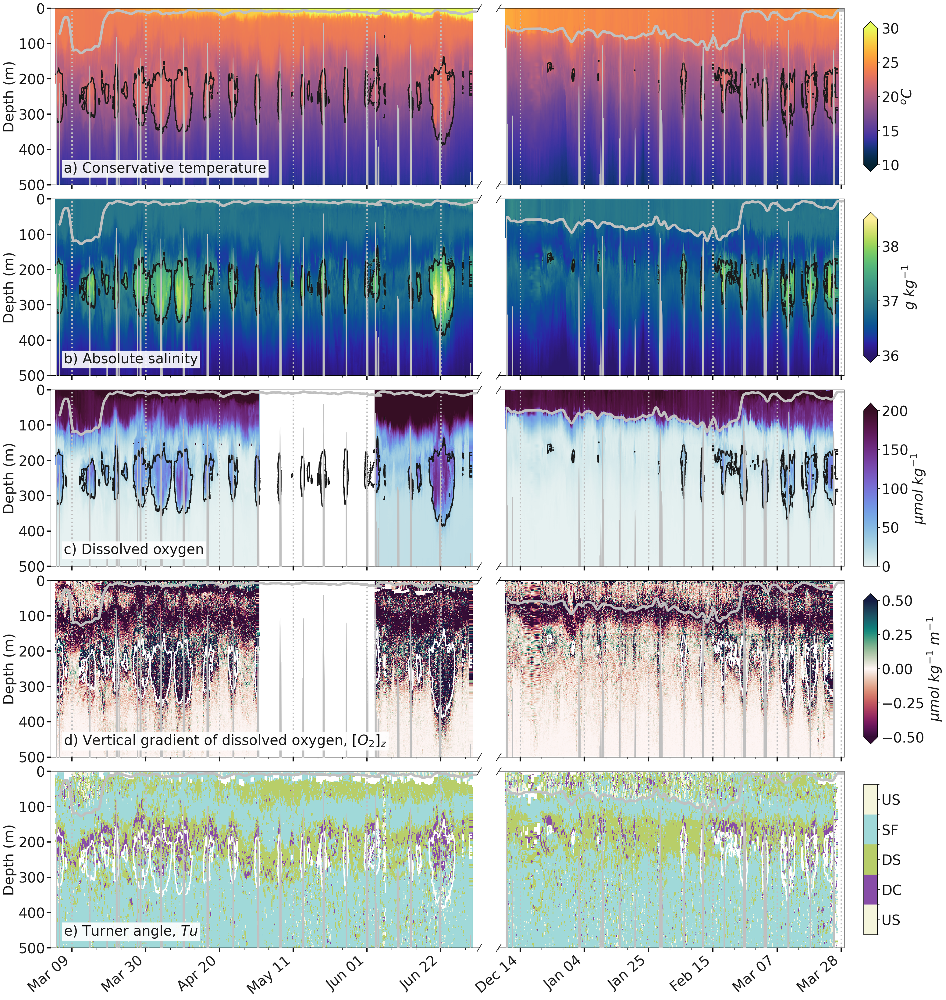

In [155]:
fnts=33
alp=0.9
minn=.03
linw=4
ff = plt.figure(constrained_layout=True, figsize=(35,40))
spec2 = GridSpec(ncols=50, nrows=29+27*4+2+2+2, figure=ff)
sixee=45
right, mid, left=0, 26, 48
color_tri='k'
'-------CT------------'

ax = ff.add_subplot(spec2[0:27, right:mid])
ax2 = ff.add_subplot(spec2[0:27, mid+1:left])

yaxis=np.arange(0,1000,1)

PGWfr0, _,_ = grid_t(ds0, 'pgw_frac')
PGWfr1, _,_ = grid_t(ds1, 'pgw_frac')
PGWfr2, _,_ = grid_t(ds2, 'pgw_frac')



t=ax.text(x=minn,y=.07,s= letters[0] + ') Conservative temperature',size=fnts, transform=ax.transAxes, zorder=500)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

O220,XI, YI = grid_t(ds0, 'cons_temp')
O221,XI, YI = grid_t(ds1, 'cons_temp')
O222,XI, YI = grid_t(ds2, 'cons_temp')

ax.pcolormesh(taxis, yaxis,pd.DataFrame(O220).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), cmap=cmo.thermal, vmin=10, vmax=30)
ax.pcolormesh(taxis, yaxis,pd.DataFrame(O221).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), cmap=cmo.thermal, vmin=10, vmax=30)

cb=ax2.pcolormesh(taxis, yaxis,pd.DataFrame(O222).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), cmap=cmo.thermal, vmin=10, vmax=30)
cbaxes = ff.add_subplot(spec2[2:27-2, left+1])
cbb=plt.colorbar(cb, cax=cbaxes, extend= 'both')
cbb.set_label(r'$^oC$', fontsize=fnts)
cbb.ax.tick_params(labelsize=fnts)

ax.contour(taxis, yaxis, pd.DataFrame(PGWfr0).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['k', 'w'], linewidths=[3,3])
ax.contour(taxis, yaxis, pd.DataFrame(PGWfr1).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['k', 'w'], linewidths=[3,3])
ax2.contour(taxis, yaxis, pd.DataFrame(PGWfr2).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['k', 'w'], linewidths=[3, 3])

ax.plot(taxis, pd.DataFrame(mld0).interpolate(limit=2).rolling(3, center=True).mean(), c='silver', lw=linw+2)
ax.plot(taxis, pd.DataFrame(mld1).interpolate(limit=2).rolling(3, center=True).mean(), c='silver', lw=linw+2)
ax2.plot(taxis, pd.DataFrame(mld2).interpolate(limit=25).rolling(3, center=True).mean(), c='silver', lw=linw+2)


ax.fill_between(pd.to_datetime(tid_div0[0]), 1000, ds0.max_pressure, color='silver', zorder=100)
ax.fill_between(pd.to_datetime(tid_div1[0][:-1]), 1000, ds1.max_pressure, color='silver', zorder=100)
ax2.fill_between(pd.to_datetime(tid_div2[0]), 1000, ds2.max_pressure, color='silver', zorder=100)


axis_settings(ax, ax2, fnts)
ax.tick_params(axis='both', which='major', labelsize=fnts)
ax2.tick_params(axis='both', which='major', labelsize=fnts)


ax2.xaxis.set_ticklabels([])
ax.xaxis.set_ticklabels([])

'------- o2 grad  sections-------------'

ax = ff.add_subplot(spec2[29:29+27, right:mid])
ax2 = ff.add_subplot(spec2[29:29+27, mid+1:left])

t=ax.text(x=minn,y=.07,s=letters[1] + ') Absolute salinity',size=fnts, transform=ax.transAxes, zorder=500)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

O220,XI, YI = grid_t(ds0, 'abs_salinity')
O221,XI, YI = grid_t(ds1, 'abs_salinity')
O222,XI, YI = grid_t(ds2, 'abs_salinity')

ax.pcolormesh(taxis, yaxis,pd.DataFrame(O220).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), vmin=36, vmax=38.5, cmap=cmo.haline)
ax.pcolormesh(taxis, yaxis,pd.DataFrame(O221).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), vmin=36, vmax=38.5, cmap=cmo.haline)

cb=ax2.pcolormesh(taxis, yaxis,pd.DataFrame(O222).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), vmin=36, vmax=38.5, cmap=cmo.haline)
cbaxes = ff.add_subplot(spec2[29+2:29+27-2, left+1])
cbb=plt.colorbar(cb, cax=cbaxes, extend= 'both')
cbb.set_label(r'$g$ $kg^{-1}$', fontsize=fnts)
cbb.ax.tick_params(labelsize=fnts)
ax.contour(taxis, yaxis, PGWfr0, levels=[0.25], colors=['k', 'w'], linewidths=[2,3])
ax.contour(taxis, yaxis, PGWfr1, levels=[0.25], colors=['k', 'w'], linewidths=[2,3])
ax2.contour(taxis, yaxis, PGWfr2, levels=[0.25], colors=['k', 'w'], linewidths=[2, 3])



ax.plot(taxis, pd.DataFrame(mld0).interpolate(limit=2).rolling(3, center=True).mean(), c='silver', lw=linw+2)
ax.plot(taxis, pd.DataFrame(mld1).interpolate(limit=2).rolling(3, center=True).mean(), c='silver', lw=linw+2)
ax2.plot(taxis, pd.DataFrame(mld2).interpolate(limit=25).rolling(3, center=True).mean(), c='silver', lw=linw+2)

ax.contour(taxis, yaxis, pd.DataFrame(PGWfr0).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['k', 'w'], linewidths=[3,3])
ax.contour(taxis, yaxis, pd.DataFrame(PGWfr1).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['k', 'w'], linewidths=[3,3])
ax2.contour(taxis, yaxis, pd.DataFrame(PGWfr2).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['k', 'w'], linewidths=[3, 3])

ax.fill_between(pd.to_datetime(tid_div0[0]), 1000, ds0.max_pressure, color='silver', zorder=100)
ax.fill_between(pd.to_datetime(tid_div1[0][:-1]), 1000, ds1.max_pressure, color='silver', zorder=100)
ax2.fill_between(pd.to_datetime(tid_div2[0]), 1000, ds2.max_pressure, color='silver', zorder=100)


axis_settings(ax, ax2, fnts)
ax.tick_params(axis='both', which='major', labelsize=fnts)
ax2.tick_params(axis='both', which='major', labelsize=fnts)

ax2.xaxis.set_ticklabels([])
ax.xaxis.set_ticklabels([])

# '-------tu  sections-------------'

ax = ff.add_subplot(spec2[29+27+2:29+27*2+2, right:mid])
ax2 = ff.add_subplot(spec2[29+27+2:29+27*2+2, mid+1:left])

t=ax.text(x=minn,y=.07,s=letters[2] + ') Dissolved oxygen',size=fnts, transform=ax.transAxes, zorder=500)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

O220,XI, YI = grid_t(ds0, 'oxygen_concentration')
O221,XI, YI = grid_t(ds1, 'oxygen_concentration')
O222,XI, YI = grid_t(ds2, 'oxygen_concentration')


ax.pcolormesh(taxis, yaxis,pd.DataFrame(O220).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), cmap=cmo.dense, vmin=0, vmax=200)
ax.pcolormesh(taxis, yaxis,pd.DataFrame(O221).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), cmap=cmo.dense, vmin=0, vmax=200)

cb=ax2.pcolormesh(taxis, yaxis,pd.DataFrame(O222).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), cmap=cmo.dense, vmin=0, vmax=200)
# cb=ax2.pcolormesh(taxis, yaxis,pd.DataFrame(O22).interpolate(limit=3, axis=1).to_numpy(), cmap=cmo.dense, vmin=0, vmax=200)
cbaxes = ff.add_subplot(spec2[29+27+2+2:29+27*2+2, left+1])
cbb=plt.colorbar(cb, cax=cbaxes, extend= 'max')
cbb.set_label(r'$\mu mol$ $kg^{-1}$', fontsize=fnts)
cbb.ax.tick_params(labelsize=fnts)


ax.plot(taxis, pd.DataFrame(mld0).interpolate(limit=2).rolling(3, center=True).mean(), c='silver', lw=linw+2)
ax.plot(taxis, pd.DataFrame(mld1).interpolate(limit=2).rolling(3, center=True).mean(), c='silver', lw=linw+2)
ax2.plot(taxis, pd.DataFrame(mld2).interpolate(limit=25).rolling(3, center=True).mean(), c='silver', lw=linw+2)

ax.contour(taxis, yaxis, pd.DataFrame(PGWfr0).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['k', 'w'], linewidths=[3,3])
ax.contour(taxis, yaxis, pd.DataFrame(PGWfr1).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['k', 'w'], linewidths=[3,3])
ax2.contour(taxis, yaxis, pd.DataFrame(PGWfr2).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['k', 'w'], linewidths=[3, 3])

ax.fill_between(pd.to_datetime(tid_div0[0]), 1000, ds0.max_pressure, color='silver', zorder=100)
ax.fill_between(pd.to_datetime(tid_div1[0][:-1]), 1000, ds1.max_pressure, color='silver', zorder=100)
ax2.fill_between(pd.to_datetime(tid_div2[0]), 1000, ds2.max_pressure, color='silver', zorder=100)


axis_settings(ax, ax2, fnts)
ax.tick_params(axis='both', which='major', labelsize=fnts)
ax2.tick_params(axis='both', which='major', labelsize=fnts)
ax2.xaxis.set_ticklabels([])
ax.xaxis.set_ticklabels([])


ax = ff.add_subplot(spec2[29+27*2+2+2:29+27*3+2+2, right:mid])
ax2 = ff.add_subplot(spec2[29+27*2+2+2:29+27*3+2+2, mid+1:left])

yaxis=np.arange(0,1000,1)

PGWfr0, _,_ = grid_t(ds0, 'pgw_frac')
PGWfr1, _,_ = grid_t(ds1, 'pgw_frac')
PGWfr2, _,_ = grid_t(ds2, 'pgw_frac')

t=ax.text(x=minn,y=.07,s=letters[3] +') Vertical gradient of dissolved oxygen, $[O_2]_z$',size=fnts, transform=ax.transAxes, zorder=500)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

O220,XI, YI = grid_t(ds0, 'oxygen_concentration')
O221,XI, YI = grid_t(ds1, 'oxygen_concentration')
O222,XI, YI = grid_t(ds2, 'oxygen_concentration')


ax.pcolormesh(taxis, yaxis[:-1],(np.diff(pd.DataFrame(O220).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), axis=0)/2), cmap=cmo.curl_r, vmin=-0.5, vmax=0.5)
ax.pcolormesh(taxis, yaxis[:-1],(np.diff(pd.DataFrame(O221).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), axis=0)/2), cmap=cmo.curl_r, vmin=-0.5, vmax=0.5)

cb=ax2.pcolormesh(taxis, yaxis[:-1],(np.diff(pd.DataFrame(O222).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), axis=0)/2), cmap=cmo.curl_r, vmin=-0.5, vmax=0.5)
cbaxes = ff.add_subplot(spec2[29+27*2+2+2+2:29+27*3+2+2-2, left+1])
cbb=plt.colorbar(cb, cax=cbaxes, extend= 'both')
cbb.set_label(r'$\mu mol$ $kg^{-1}$ $m^{-1}$', fontsize=fnts)
cbb.ax.tick_params(labelsize=fnts)

ax.contour(taxis, yaxis, pd.DataFrame(PGWfr0).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['w', 'w'], linewidths=[3,3])
ax.contour(taxis, yaxis, pd.DataFrame(PGWfr1).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['w', 'w'], linewidths=[3,3])
ax2.contour(taxis, yaxis, pd.DataFrame(PGWfr2).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['w', 'w'], linewidths=[3, 3])

ax.plot(taxis, pd.DataFrame(mld0).interpolate(limit=2).rolling(3, center=True).mean(), c='silver', lw=linw+2)
ax.plot(taxis, pd.DataFrame(mld1).interpolate(limit=2).rolling(3, center=True).mean(), c='silver', lw=linw+2)
ax2.plot(taxis, pd.DataFrame(mld2).interpolate(limit=25).rolling(3, center=True).mean(), c='silver', lw=linw+2)


ax.fill_between(pd.to_datetime(tid_div0[0]), 1000, ds0.max_pressure, color='silver', zorder=100)
ax.fill_between(pd.to_datetime(tid_div1[0][:-1]), 1000, ds1.max_pressure, color='silver', zorder=100)
ax2.fill_between(pd.to_datetime(tid_div2[0]), 1000, ds2.max_pressure, color='silver', zorder=100)


axis_settings(ax, ax2, fnts)
ax.tick_params(axis='both', which='major', labelsize=fnts)
ax2.tick_params(axis='both', which='major', labelsize=fnts)
ax2.xaxis.set_ticklabels([])
ax.xaxis.set_ticklabels([])

ax = ff.add_subplot(spec2[29+27*3+2+2+2:29+27*4+2+2+2, right:mid])
ax2 = ff.add_subplot(spec2[29+27*3+2+2+2:29+27*4+2+2+2, mid+1:left])

t=ax.text(x=minn,y=.07,s=letters[4] + ') Turner angle, $Tu$',size=fnts, transform=ax.transAxes, zorder=500)
t.set_bbox(dict(facecolor='w', alpha=alp, edgecolor='w'))

yaxis=np.arange(0,1000,2)
ax.pcolormesh(taxis, yaxis[:-1], np.rad2deg(Tu_rolled0).to_numpy(), cmap=cma , norm=norm)
ax.pcolormesh(taxis, yaxis[:-1], np.rad2deg(Tu_rolled1).to_numpy(), cmap=cma , norm=norm)
cb=ax2.pcolormesh(taxis, yaxis[:-1], np.rad2deg(Tu_rolled2).to_numpy(), cmap=cma , norm=norm)



cbaxes = ff.add_subplot(spec2[29+27*3+2+2+2+2:29+27*4+2+2+2-2, left+1])
cbb=plt.colorbar(cb, cax=cbaxes, ticks=[-135,-67.5,-0,67.5,135])

cbb.ax.set_yticklabels(['US', 'DC', 'DS', 'SF', 'US'])
cbb.ax.tick_params(labelsize=fnts)

ax.plot(taxis, pd.DataFrame(mld0).interpolate(limit=2).rolling(3, center=True).mean(), c='silver', lw=linw+2)
ax.plot(taxis, pd.DataFrame(mld1).interpolate(limit=2).rolling(3, center=True).mean(), c='silver', lw=linw+2)
ax2.plot(taxis, pd.DataFrame(mld2).interpolate(limit=25).rolling(3, center=True).mean(), c='silver', lw=linw+2)

yaxis=np.arange(0,1000,1)
ax.contour(taxis, yaxis, pd.DataFrame(PGWfr0).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['w', 'w'], linewidths=[3,3])
ax.contour(taxis, yaxis, pd.DataFrame(PGWfr1).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['w', 'w'], linewidths=[3,3])
ax2.contour(taxis, yaxis, pd.DataFrame(PGWfr2).interpolate(limit=10, axis=0).interpolate(limit=3, axis=1).rolling(3, axis=0, center=True).mean().rolling(1, axis=1, center=True).mean().bfill().to_numpy(), levels=[0.25], colors=['w', 'w'], linewidths=[3, 3])

ax.fill_between(pd.to_datetime(tid_div0[0]), 1000, ds0.max_pressure, color='silver', zorder=100)
ax.fill_between(pd.to_datetime(tid_div1[0][:-1]), 1000, ds1.max_pressure, color='silver', zorder=100)
ax2.fill_between(pd.to_datetime(tid_div2[0]), 1000, ds2.max_pressure, color='silver', zorder=100)


axis_settings(ax, ax2, fnts)
ax.tick_params(axis='both', which='major', labelsize=fnts)
ax2.tick_params(axis='both', which='major', labelsize=fnts)
plt.setp( ax.xaxis.get_majorticklabels() , rotation=40,  horizontalalignment='right')
plt.setp( ax2.xaxis.get_majorticklabels(), rotation=40, horizontalalignment='right' )


plt.savefig('Figure_supl_2.png', dpi=600)